In [2]:
from __future__ import print_function


In [8]:
# We'll need numpy for some mathematical operations
import numpy as np
import json

# Librosa for audio
import librosa

# matplotlib for displaying the output
import matplotlib.pyplot as plt
%matplotlib inline
# And seaborn to make it look nice
import seaborn
seaborn.set(style='ticks')

# and IPython.display for audio output
import IPython.display

In [7]:
audio_path = './Dora01D.wav'
audio_path2 = './Sean01D.wav'

# input1 = np.array([])
# input2 = np.array([])
input1 = []
input2 = []

for i in range(60):
    y, sr = librosa.load(audio_path, duration=1.0, offset=i)
    input1.append(y)
for i in range(60):
    y2, sr = librosa.load(audio_path2, duration=1.0, offset=i)
#     input2 = np.append(input2,y2)
    input2.append(y2)
    
print type(input1[0])
print len(input1[0])

SyntaxError: invalid syntax (<ipython-input-7-c630ab35b166>, line 17)

In [ ]:
print('HAS_SAMPLERATE: ', librosa.core.audio._HAS_SAMPLERATE)

In [5]:
# IPython.display.Audio(data=y, rate=sr)
IPython.display.Audio(data=y2, rate=sr)

NameError: name 'y2' is not defined

In [6]:
import json

# S is the array of S melspectograms for each 1second sample (after log transformation)
S1 = []
S2 = []
labelled_D = []
labelled_S = []


# Let's make and display a mel-scaled power (energy-squared) spectrogram
# Convert to log scale (dB). We'll use the peak power as reference.
for i in range(len(input1)):
    melSpec1 = librosa.feature.melspectrogram(input1[i], sr=sr, n_mels=26)
    melSpec2 = librosa.feature.melspectrogram(input2[i], sr=sr, n_mels=26)
    log_S1 = librosa.logamplitude(melSpec1, ref_power=np.max) + 100
    log_S2 = librosa.logamplitude(melSpec2, ref_power=np.max) + 100
    S1.append(log_S1)
    S2.append(log_S2)
    # reshape the input arrays to be col matrix
    S1[i] = S1[i].reshape((26*44,1))
    S2[i] = S2[i].reshape((26*44,1))
    # 1 is Dora
    labelled_D.append((S1[i], 1))
    labelled_S.append((S2[i], 0))

print len(S1), len(S1[0]), len(S1[0][0])
print type(S1), type(S1[0]), type(S1[0][0])

print S1[59].shape
# print labelled_D
# put two files into one inputData json
inputData = labelled_D + labelled_S
# inp = open("inputdata.json", "w")
# json.dump(inputData,inp, cls=NumpyEncoder)
# inp.close()
print inputData




SyntaxError: invalid syntax (<ipython-input-6-2b0e192b95ae>, line 26)

In [ ]:
# Make a new figure
plt.figure(figsize=(12,4))

# Display the spectrogram on a mel scale
# sample rate and hop length parameters are used to render the time axis
librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')

# Put a descriptive title on the plot
plt.title('mel power spectrogram')

# draw a color bar
plt.colorbar(format='%+02.0f dB')

# Make the figure layout compact
plt.tight_layout()

In [23]:
y_harmonic, y_percussive = librosa.effects.hpss(y)

In [24]:
IPython.display.Audio(data=y_harmonic, rate=sr)


In [25]:
IPython.display.Audio(data=y_percussive, rate=sr)

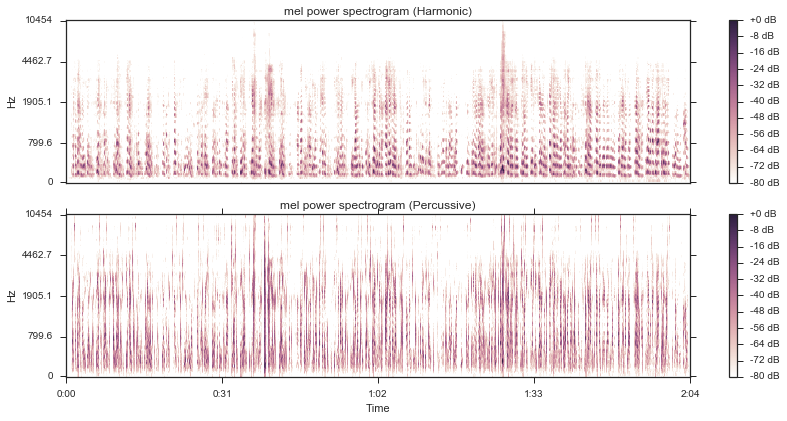

In [26]:
# What do the spectrograms look like?
# Let's make and display a mel-scaled power (energy-squared) spectrogram
S_harmonic   = librosa.feature.melspectrogram(y_harmonic, sr=sr)
S_percussive = librosa.feature.melspectrogram(y_percussive, sr=sr)

# Convert to log scale (dB). We'll use the peak power as reference.
log_Sh = librosa.logamplitude(S_harmonic, ref_power=np.max)
log_Sp = librosa.logamplitude(S_percussive, ref_power=np.max)

# Make a new figure
plt.figure(figsize=(12,6))

plt.subplot(2,1,1)
# Display the spectrogram on a mel scale
librosa.display.specshow(log_Sh, sr=sr, y_axis='mel')

# Put a descriptive title on the plot
plt.title('mel power spectrogram (Harmonic)')

# draw a color bar
plt.colorbar(format='%+02.0f dB')

plt.subplot(2,1,2)
librosa.display.specshow(log_Sp, sr=sr, x_axis='time', y_axis='mel')

# Put a descriptive title on the plot
plt.title('mel power spectrogram (Percussive)')

# draw a color bar
plt.colorbar(format='%+02.0f dB')

# Make the figure layout compact
plt.tight_layout()